In [1]:
#!pip install treys
#!pip install termcolor
#!pip install pandas
#!pip install tensorflow

In [2]:
import PIL.Image
import numpy as np
from typing import Union
from glob import glob
import pandas as pd
import os
import time
from treys import Card
from termcolor import colored
from utils import eval_listof_games , debug_listof_games, save_results , load_results

# [IAPR][iapr]: Project


**Group ID:** 07

**Author 1 (sciper):** Mehrdad Kiani    (269424)   
**Author 2 (sciper):** Clemente Gotelli (331818)  
**Author 3 (sciper):** Selimcan Ozden   (297594)   

**Release date:** 29.04.2022


## Important notes

The assignments are designed to teach practical implementation of the topics presented during class as well as preparation for the final project, which is a practical project which ties together the topics of the course. 

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook !** rerun the notebook from scratch `Kernel` > `Restart & Run All`


[iapr]: https://github.com/LTS5/iapr

---
## 0. Introduction

An anonymous card player that we will name Bartick Pruel is willing to improve his poker skills. To do so, he asked our lab to design a tool that will automatically detect the hands of the players around the table. 

---

## 1. Data

To achieve your task, you will be given images that look like this (without the overlay)

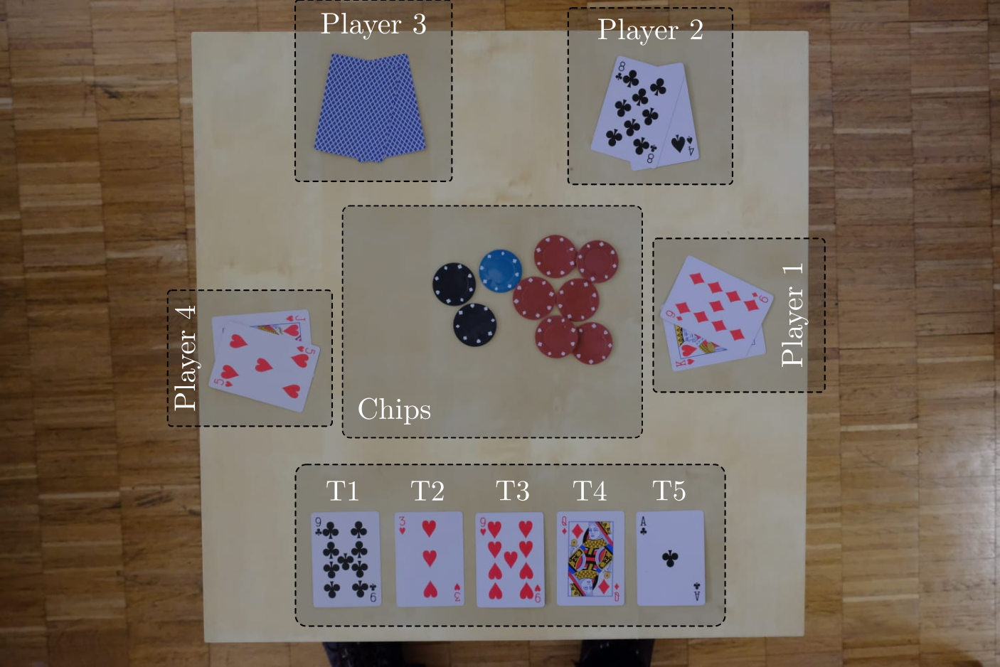


### 1.1. Table layout

The table is divided into 3 main parts:
* **Table cards (T1-T5)**: These cards are shared by every player. They are defined as the flop (T1-T3), the turn (T4) and the river (T5). The table cards are *always* visible.
* **Player cards (P11-P42)**: The cards played by each player (4 pairs). Each player *always* has 2 cards in hand. When a player is not playing, you can see the back of the cards (ex: player 3 here).
* **Chips**: The chips at the center of the table are named the pot.

### 1.2. Cards & Chips

The cards deck are composed of 52 cards split into 4 different colors: (D)imanond, (H)eart, (S)pade, (C)lub. Each color is composed of 13 different cards: 2, 3, 4, 5, 6, 7, 8, 9, 10, (J)ack, (Q)ueen, (K)ing and (A)ce.

Th chips can be of 5 different colors: (r)ed, (g)reen, (b)lue, blac(k) or (w)hite.


### 1.3 Structure

You can download the data for the project here: [download data](https://drive.google.com/file/d/1d7rOe88kEK1CEaLvYgNZkxrtKImLVC9X/view)

```
data 
│
└─── image_setup
│    │    back_cards.jpg      # Back of the cards (either blue or red)
│    │    chips.jpg           # Set of chips used (red, green, blue, black, white)
│    │    kings.jpg           # Kings from the 4 colors (diamond, heart, spade, club)
│    │    spades_suits.jpg    # All cards of spades (2 - 10, Jack, Queen, King, Ace)
│    │    table.jpg           # Empty table
│    └─── ultimate_test.jpg   # If it works on that image, you would probably end up with a good score
│
└─── train
│    │    train_00.jpg        # Train image 00
│    │    ...
│    │    train_27.jpg        # Train image 27
│    └─── train_labels.csv    # Ground truth of the train set
│
└─── test
     │    test_00.jpg         # Test image 00 (day of the exam only)
     │    ...
     └─── test_xx             # Test image xx (day of the exam only)
```


---

## 2. Tasks


Your task is to predict the following parameters for a set of images.

* **T1** (str): String code of the first card of the flop (far left) 
* **T2** (str): String code of the second card of the flop
* **T3** (str): String code of the third card of the flop
* **T4** (str): String code of the turn
* **T5** (str): String code of the river


* **P11** (str or int): String code of player 1 card 1. Should be 0 if player 1 is not Playing.
* **P12** (str or int): String code of player 1 card 2. Should be 0 if player 1 is not Playing.
* **P21** (str or int): String code of player 2 card 1. Should be 0 if player 2 is not Playing.
* **P22** (str or int): String code of player 2 card 2. Should be 0 if player 2 is not Playing.
* **P31** (str or int): String code of player 3 card 1. Should be 0 if player 3 is not Playing.
* **P32** (str or int): String code of player 3 card 2. Should be 0 if player 3 is not Playing.
* **P41** (str or int): String code of player 4 card 1. Should be 0 if player 4 is not Playing.
* **P42** (str or int): String code of player 4 card 2. Should be 0 if player 5 is not Playing.


* **CR** (int): Number of (r)ed chips in the pot
* **CG** (int): Number of (g)reen chips in the pot
* **CB** (int): Number of (b)lue chips in the pot
* **CK** (int): Number of blac(k) chips in the pot
* **CW** (int): Number of (w)hite chips in the pot


The output is saved using the function **save_results** as presented below.

---
## 3. Evaluation

**Before the exam**
   - Create a zipped folder named **groupid_xx.zip** that you upload on moodle (xx being your group number).
   - Include a **runnable** code (Jupyter Notebook and external files) and your presentation in the zip folder.
   
**The day of the exam**
   - You will be given a **new folder** with few images, but **no ground truth** (csv file).
   - We will ask you to run your pipeline in **real time** and to send us your prediction of the task you obtain with the provided function **save_results**. 
   - On our side, we will compute the performance of your classification algorithm. 
   - To evaluate your method, we will use the **evaluate_game** function presented below. To understand how the provided functions work, please read the documentation of the functions in **utils.py**.
   - **Please make sure your function returns the proper data format to avoid points penalty on the day of the exam**. 
---


## 4. Your code

### General explanation of the workflow:


GENERAL EXPLANATION: FROM IMAGE LOAD TO MACHINE LEARNING PREDICTION  
We define complementary functions to incorporate inside the **process_image** function. The detail explanation is given inside each function. First, we import the necessary packages for the script.

In [3]:
# Packages to use:
import matplotlib.pyplot as plt
import cv2
import imutils

from numpy import random

import skimage
import skimage.io
import skimage.filters as filters
from skimage.filters import sobel
from skimage.morphology import disk, octagon
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from skimage import morphology
from skimage import measure

from scipy.ndimage.morphology import binary_fill_holes
from scipy import ndimage
from scipy.spatial import distance

from matplotlib.ticker import MaxNLocator

import math

import csv

import string

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img

import keras

Now the define some useful functions for image handling that will be used several times during the project. We include also the explanation on how they work.

In [4]:
def order_points(pts):
    # initialzie a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    rect = np.zeros((4, 2), dtype = "float32")
    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    s = pts.sum(axis = 1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    diff = np.diff(pts, axis = 1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    # return the ordered coordinates
    return rect

def four_point_transform(image, pts):
    # obtain a consistent order of the points and unpack them
    # individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect
    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    # now that we have the dimensions of the new image, construct
    # the set of destination points to obtain a "birds eye view",
    # (i.e. top-down view) of the image, again specifying points
    # in the top-left, top-right, bottom-right, and bottom-left
    # order
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")
    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    # return the warped image
    return warped


def fill_holes(img):
    # This function keeps the biggest blob region and turns all the rest into background.
    labels_mask = measure.label(img)                       
    regions = measure.regionprops(labels_mask)
    regions.sort(key=lambda x: x.area, reverse=True)
    if len(regions) > 1:
        for rg in regions[1:]:
            labels_mask[rg.coords[:,0], rg.coords[:,1]] = 0
    labels_mask[labels_mask!=0] = 1
    
    thresh = labels_mask
    thresh = (thresh*1*255).astype(np.uint8)
    
    im_floodfill = thresh.copy()
    h, w = thresh.shape[:2]
    mask = np.zeros((h+2, w+2), np.uint8)
    
    # Floodfill from point (0, 0)
    cv2.floodFill(im_floodfill, mask, (0,0), 255);

    # Invert floodfilled image
    im_floodfill_inv = cv2.bitwise_not(im_floodfill)

    # Combine the two images to get the foreground.
    thresh = thresh | im_floodfill_inv

    return thresh

---

# Table outline functions

In [5]:
# We define a function "table_zone" that gets the photo, locates the table in it, and returns a square approximation of the 
# region where tha table is located. It applies: histogram equalization, gaussian blur, and binary + otsu threshold. 
# Then it find all the contours, for later keep only the largest. That contour will be the one corresponding to the table.
# As the contour can sometimes contain irregular shapes because of glare in the floor, we choose to adjust a square 
# to approximate the shape of the table, which side will be equal to the minimum side of the adjusted rectangle obtained
# using the openCV function boundingRect.
# 

def table_zone(image, plot_preprocessing):
    # copy image and reduce size for faster processing
    ratio = image.shape[0] / 500.0
    orig = image.copy()
    im = imutils.resize(image, height = 500)
        
    # transform to grayscale and histogram equalization.   
    gray = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)
    gray = cv2.equalizeHist(gray)

    # apply gaussian blur 
    gaussian = cv2.GaussianBlur(gray,(5,5),0)
    
    # and binary thresholding

    ret, thresh = cv2.threshold(gray, 140, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    # we get the contours
    contours = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)    
    
    # we keep the largest contour and we adjust a rectangle to approximate it. 
    c = max(contours, key = cv2.contourArea)
    x,y,w,h = cv2.boundingRect(c)
    side = min(w,h)
    
    x = round(x*ratio) 
    y = round(y*ratio) 
    side = round(side*ratio)
    
    # We give the option of plotting the process' outputs.
    if plot_preprocessing:
        fig = plt.figure(figsize=(30, 15))
        fig.suptitle('Image pre-processing', fontsize=30)
        rows = 2
        columns = 2

        fig.add_subplot(rows, columns, 1)
        plt.imshow(im)
        plt.axis('off')
        plt.title("Original photo", fontsize=20)

        fig.add_subplot(rows, columns, 2)
        plt.imshow(gray, cmap=plt.cm.gray)
        plt.axis('off')
        plt.title("Grayscale image", fontsize=20)

        fig.add_subplot(rows, columns, 3)
        plt.imshow(thresh, cmap=plt.cm.gray)
        plt.axis('off')
        plt.title('Binary image', fontsize=20)

        fig.add_subplot(rows, columns, 4)
        # draw the biggest contour (c) in green
        
        plt.imshow(im)
        plt.plot([x/ratio,(x+side)/ratio, (x+side)/ratio, x/ratio, x/ratio], 
                 [y/ratio,y/ratio,(y+side)/ratio,(y+side)/ratio, y/ratio], color='lime')
        plt.axis('off')
        plt.title('Table rectangle approximation photo', fontsize=20)
        plt.show()
    
    return x,y,side


# With the output of the "table_zone" function, we crop the image to separate and identify the different important zones
# in the board (i.e. players' cards, chips, and table cards). The dimensions of the crop were chose based on the train
# images given by the TA group taken in consideration that both cards and chips are roughly in the same zome.
    
def subimages(im, x, y, side, plot_gamezones):
    
    # Table cards
    ZT = im[int(y+0.7*side):int(y+side), x:int(x+side), 0:3]
    
    # Chips 
    ZC = im[int(y+0.25*side):int(y+0.75*side), int(x+0.25*side):int(x+0.75*side), 0:3]
    
    # Player 1
    ZP1 = im[int(y+0.25*side):int(y+0.7*side), int(x+0.7*side):int(x+side), 0:3]
    ZP1 = imutils.rotate_bound(ZP1, 90)
    
    # Player 2
    ZP2 = im[int(y):int(y+0.3*side), int(x+0.5*side):int(x+0.9*side), 0:3]
    ZP2 = imutils.rotate_bound(ZP2, 180)
    
    # Player 3
    ZP3 = im[int(y):int(y+0.3*side), int(x+0.05*side):int(x+0.5*side), 0:3]
    ZP3 = imutils.rotate_bound(ZP3, 180)
    
    # Player 4
    ZP4 = im[int(y+0.3*side):int(y+0.7*side), int(x):int(x+0.3*side), 0:3]
    ZP4 = imutils.rotate_bound(ZP4, 270)
    
    # We give the option of plotting the zones.
    if plot_gamezones:
        fig = plt.figure(figsize=(30, 15))
        fig.suptitle('Different game zones', fontsize=30)
        rows = 3
        columns = 2

        fig.add_subplot(rows, columns, 1)
        plt.imshow(ZP1)
        plt.axis('off')
        plt.title("Player 1", fontsize=20)

        fig.add_subplot(rows, columns, 2)
        plt.imshow(ZP2)
        plt.axis('off')
        plt.title("Player 2", fontsize=20)

        fig.add_subplot(rows, columns, 4)
        plt.imshow(ZP3)
        plt.axis('off')
        plt.title("Player 3", fontsize=20)

        fig.add_subplot(rows, columns, 3)
        plt.imshow(ZP4)
        plt.axis('off')
        plt.title("Player 4", fontsize=20)

        fig.add_subplot(rows, columns, 5)
        plt.imshow(ZC)
        plt.axis('off')
        plt.title("Chips", fontsize=20)

        fig.add_subplot(rows, columns, 6)
        plt.imshow(ZT)
        plt.axis('off')
        plt.title("Table", fontsize=20)
        plt.show()
    
    return ZP1, ZP2, ZP3, ZP4, ZT, ZC



---

# Table cards functions

The process for isolating the cards of the Table player, and the way of getting the upper left corner (ULC), are explained below. 

In short, we have two functions: 
- one that contains only the filtering process of that region *(table_filters)*, and
- the main one who calls this function and uses the output to get the ULC of each card.

With these two functions we follow the following steps:
1. We resize the image to make the filter work faster. We keep the ratio for later convert the obtained coordinates back to the original size.
2. We filter the image until we get a binary mask with (hopefully) all the cards in it. Just because the process is not perfect due to lightning conditions, we perform this process by getting one card per time.
3. From the mask, we fit contours and polylines to these edges. We take these polylines and fit a 4-side polygon (a rectangle).
4. If we find one or more, we get the contour/polyline further left.
5. We subtract this rectangle from the original image by using the contour and the resize ratio saved before. We also store the coordinates of the bottom left coordinate for later. 
6. We replace the subtracted section with only black pixels. This way, the shape of the image does not change, and we can then compare the coordinates of all images and orther them from left to right.
7. The subtracted region is then reshaped by using the four extreme points of the rectangle, so we have a perfect rectangle, no matter the inclination of the photo.
8. We use this perfect rectangle to get the ULC, and we store it in a list.
9. Finally, we reapply the filter and the complete process subtracting one card each time until we get the 5.

In [6]:
# We first define the filters for the cards.
def table_filters(image):
    
    # TO YUV to equalize brightness and then back to BGR
    image = cv2.cvtColor(image,cv2.COLOR_BGR2YUV)    
    image[:,:,0] = cv2.equalizeHist(image[:,:,0])
    image = cv2.cvtColor(image, cv2.COLOR_YUV2BGR)
    
    # To gray for blurring and thresholding
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (7, 7), 0)
    ret, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    
    # We fill the image to remove small blobs
    
    im_floodfill = thresh.copy()
    h, w = thresh.shape[:2]
    mask = np.zeros((h+2, w+2), np.uint8)
    cv2.floodFill(im_floodfill, mask, (0,0), 255);
    im_floodfill_inv = cv2.bitwise_not(im_floodfill)
    thresh = thresh | im_floodfill_inv

    # We open the mask to remove borders
    kernel = np.ones((55,40),np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

    edged = cv2.Canny(thresh, 75, 200)
    
    return gray, thresh, edged
    

# The function "table_cards" takes the binarized image of the table cards zone and the edges obtained from the mask.
# The function returns the table's game.    
def table_cards(ZT, plot_tableCards):
    lastOne = False
    ratio = ZT.shape[0] / 500.0
    orig = ZT.copy()
    image = imutils.resize(ZT, height = 500)
    origResize = image.copy()
    
    # convert the image to grayscale, blur it, and find edges
    # in the image
    
    imTs = []          # We initialize the array for storing individual cards
    cornerTs = []      # Their left upper corner
    xCoordCorners = [] # The array to store the far left x coordinate of each card 
    numbersTs = []     # The array for numbers 
    suitsTs = []       # The array for suits
    
    continueLoop = True # Aux boolean
    
    
    ########### WE LOOP 5 TIMES TO FIND THE 5 CARDS ###########
    # We print information in console from time to time to track the detection process
    
    iteration = 1
    while continueLoop:
        #print("_"*120)
        #print("Iteration number: " + str(iteration))
        
        # WE FILTER THE IMAGE AND GET THE CONTOURS, SORTED BY AREA 
        gray, thresh, edged = table_filters(image)
        imShape = image.shape
        cnts = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]

        screenCnt = []
        
        for c in cnts:
            # approximate the contour with polyline
            peri = cv2.arcLength(c, True)
            approx = cv2.approxPolyDP(c, 0.02 * peri, True)
            # if our approximated contour has four points, then we
            # can assume that we have found our rectangles
            if len(approx) == 4:
                screenCnt.append(approx)
                
        #print("The number of contours with 4 sides is: " + str(len(screenCnt)))

        
        # WE SORT THE CONTOURS FROM LEFT TO RIGHT BASED ON ONE OF THEIR X COORDINATE
        screenCnt = sorted(screenCnt, key=lambda x: x[0][0][0])        

        aux = True # Becomes False once it finds a contour that corresponds to a card to later
                   # restart filtering process.
        
        for j in range(0, len(screenCnt)):
    
            if aux:
            
                # WE GET THE VERTICES OF THE POLYGON
                corners = screenCnt[j].reshape(4, 2)
                
                # WE REPROJECT THE 4-SIDE CONTOUR TO A RECTANGLE BASED ON ITS VERTICES 
                imT = four_point_transform(image, corners)
                
                # WE GET THE EXTREMES OF THE CONTOUR
                extLeft = min(x[0] for x in corners)
                extRight= max(x[0] for x in corners)
                Tsize = imT.shape
                
                # If the contour has a width normaly found in the example, we have a card worthy of extract.
                if Tsize[0]>240 and Tsize[1]>170:
                    
                    aux = False # As he enters, we stop the loop
                    imTs.append(imT) # We append the image
                    
                    cornerT = imT[0:int(0.3*Tsize[0]), 0:int(0.16*Tsize[1])] # We get the corner
                    
                    # We split the corner into number and suit and pass both to grayscale
                    numberT = cv2.cvtColor(cornerT[0:int(len(cornerT)/2),:], cv2.COLOR_BGR2GRAY)
                    suitT = cv2.cvtColor(cornerT[int(len(cornerT)/2):,:], cv2.COLOR_BGR2GRAY)
                    
                    # We equalize the histogram
                    numberT = cv2.equalizeHist(numberT)
                            
                    # We set a standard size defined by the machine learning model
                    numberT = cv2.resize(numberT, (28,40), interpolation = cv2.INTER_AREA)
                    suitT = cv2.resize(suitT, (28,40), interpolation = cv2.INTER_AREA)
                    
                    # We add to the respective list the cropped image and the x-coordinate
                    numbersTs.append(numberT) 
                    suitsTs.append(suitT)                    
                    cornerTs.append(cornerT) 
                    xCoordCorners.append(extLeft)
                    
                    #WE CREATE A NEW IMAGE REPLACING THE SPACE WHERE THE DETECTED IMAGE WAS FOUND.
                    width = int(extRight*1.01-extLeft*0.99)
                    # Left part of the image from the detected area
                    imageLeft = image[0:int(imShape[0]), 0:int(extLeft*0.99)]                                        
                    # We create an equivalent image all black corresponding to the same section removed
                    equivalentImage = image[:, 0:np.abs(width), 0:3]
                    imageCenter = np.zeros(equivalentImage.shape, dtype=np.uint8)
                    # Right side from the area
                    imageRight = image[0:int(imShape[0]), int(extRight*1.01):int(imShape[1])]
                    # We join the image to have an equivalent with a black area where the former image was
                    image = np.hstack((imageLeft,imageCenter,imageRight))
                    
        
        # IF DURING THE PREVIOUS LOOP DOES NOT FIND A CARD, IT TRIES AGAIN RELAXING THE FITTING CURVE PARAMETER.
        
        if len(cornerTs)<iteration:
      
            for c in cnts:
            # approximate the contour
                peri = cv2.arcLength(c, True)
                approx = cv2.approxPolyDP(c, 0.1 * peri, True) #HERE'S THE RELAXATION
                # if our approximated contour has four points, then we
                # can assume that we have found our screen
                if len(approx) == 4:
                    screenCnt.append(approx)


            screenCnt = sorted(screenCnt, key=lambda x: x[0][0][0])
            
            for j in range(0, len(screenCnt)):
                if aux:
                    
                    imT = four_point_transform(image, screenCnt[j].reshape(4, 2))
                    corners = screenCnt[j].reshape(4, 2)
                    extLeft = min(x[0] for x in corners)
                    extRight= max(x[0] for x in corners)
                    Tsize = imT.shape

                    if Tsize[0]>240 and Tsize[1]>170:
                        aux = False
                                     
                        imTs.append(imT)
                        cornerT = imT[0:int(0.3*Tsize[0]), 0:int(0.16*Tsize[1])]
                        
                        numberT = cv2.cvtColor(cornerT[0:int(len(cornerT)/2),:], cv2.COLOR_BGR2GRAY)
                        suitT = cv2.cvtColor(cornerT[int(len(cornerT)/2):,:], cv2.COLOR_BGR2GRAY)
                        
                        # We equalize the histogram
                        numberT = cv2.equalizeHist(numberT)
                                    
                        numberT = cv2.resize(numberT, (28,40), interpolation = cv2.INTER_AREA)
                        suitT = cv2.resize(suitT, (28,40), interpolation = cv2.INTER_AREA)
                                                                        
                        numbersTs.append(numberT) 
                        suitsTs.append(suitT)                        
                        cornerTs.append(cornerT) 
                        xCoordCorners.append(extLeft)
                                                                     
                        width = int(extRight*1.01-extLeft*0.99)
                        imageLeft = image[0:int(imShape[0]), 0:int(extLeft*0.99)]

                        equivalentImage = image[:, 0:np.abs(width), 0:3]
                        imageCenter = np.zeros(equivalentImage.shape, dtype=np.uint8)
                        
                        imageRight = image[0:int(imShape[0]), int(extRight*1.01):int(imShape[1])]

                        image = np.hstack((imageLeft,imageCenter,imageRight))
                                    
        # We stop once we find the 5 cards.
        if len(cornerTs)==5:
            continueLoop = False
            
        iteration = iteration+1
        
    # ONCE IT DETECTS ALL THE CARDS, WE SORT THEM FROM LEFT TO RIGHT BASED ON THEIR X COORDINATE WHEN EXTRACTED
    lastOne = True
    xCoordSorted = xCoordCorners.copy()
    xCoordSorted.sort()
    indexes = [xCoordCorners.index(x) for x in xCoordSorted]
    
    cornerTs = [cornerTs[x] for x in indexes]
    imTs = [imTs[x] for x in indexes]
    numbersTs = [numbersTs[x] for x in indexes]
    suitsTs = [suitsTs[x] for x in indexes]

    if plot_tableCards and lastOne:
        fig = plt.figure(figsize=(40, 20))
        rows = 1
        columns = 2

        fig.add_subplot(rows, columns, 1)
        plt.imshow(orig)
        plt.axis('off')
        plt.title("Original image", fontsize=20)
        
        fig.add_subplot(rows, columns, 2)
        plt.imshow(image, cmap=plt.cm.gray)
        plt.axis('off')
        plt.title("final image", fontsize=20)
        plt.show()
        
        # We plot all detected cards
        _, axs = plt.subplots(1, len(imTs), figsize=(12, 12))
        axs = axs.flatten()
        for img, ax in zip(imTs, axs):
            ax.imshow(img)
            ax.axis('off')
        plt.show()
        
        # We plot the upper left corner of the detected cards
        _, axs = plt.subplots(1, len(cornerTs), figsize=(12, 12))
        axs = axs.flatten()
        for img, ax in zip(cornerTs, axs):
            ax.imshow(img, cmap=plt.cm.gray)
            ax.axis('off')
        plt.show()
        
        # We plot only the numbers
        _, axs = plt.subplots(1, len(numbersTs), figsize=(12, 12))
        axs = axs.flatten()
        for img, ax in zip(numbersTs, axs):
            ax.imshow(img, cmap=plt.cm.gray)
            ax.axis('off')
        plt.show()
        
        # We plot only the suits
        _, axs = plt.subplots(1, len(suitsTs), figsize=(12, 12))
        axs = axs.flatten()
        for img, ax in zip(suitsTs, axs):
            ax.imshow(img, cmap=plt.cm.gray)
            ax.axis('off')
        plt.show()
        
        
    # We adjust the dimensions to work with the Machine Learning Model
    numbersTs = np.expand_dims(numbersTs, axis=3)
    suitsTs = np.expand_dims(suitsTs, axis=3)
        
    return numbersTs, suitsTs


---

## Chip counting functions

Now, we explain the details of the functions that compute the number of chips and their value, as well as the cards in possesion of every player.

In [7]:
# The function "chips_count" gets the number of chiops of each color in the center of the table.
def chips_count(ZC, plotChipsCount):
    num_chips = []
    for i in range(1, 6):

        # Load in image
        image = ZC
        image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        # print(i)
        if i==1:   #blue
            lower = np.array([15,230,130])
            upper = np.array([255,255,255])
        elif i==2: # red
            lower = np.array([100,100,100])
            upper = np.array([255,255,255])
        elif i==3: #green
            lower = np.array([22,200,0])
            upper = np.array([50,255,120])
        elif i==4:  # white
            image = ZC
            lower = np.array([100,150,220])
            upper = np.array([255,255,255])
        elif i==5:  # black
            lower = np.array([0,0,0])
            upper = np.array([15,255,80])

        mask = cv2.inRange(image, lower, upper)
        #plt.imshow(mask)

        # TO REMOVE SAMLL DOTS IN THE MASK
        #find all your connected components (white blobs in your image)
        nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
        #connectedComponentswithStats yields every seperated component with information on each of them, such as size
        #the following part is just taking out the background which is also considered a component, but most of the time we don't want that.
        sizes = stats[1:, -1]; nb_components = nb_components - 1

        # minimum size of particles we want to keep (number of pixels)
        #here, it's a fixed value, but you can set it as you want, eg the mean of the sizes or whatever
        min_size = 800  

        #your answer image
        img2 = np.zeros((output.shape))
        #for every component in the image, you keep it only if it's above min_size
        for i in range(0, nb_components):
            if sizes[i] >= min_size:
                img2[output == i + 1] = 255

        kernel = np.ones((40,40),np.uint8)
        closing = cv2.morphologyEx(img2,cv2.MORPH_CLOSE, kernel, iterations = 2)
        
        closing=closing.astype(int)
        # compute the exact Euclidean distance from every binary
        # pixel to the nearest zero pixel, then find peaks in this
        # distance map
        D = ndimage.distance_transform_edt(closing)
        localMax = peak_local_max(D, indices=False, min_distance=20,labels=closing)
        # perform a connected component analysis on the local peaks,
        # using 8-connectivity, then appy the Watershed algorithm
        markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
        labels = watershed(-D, markers, mask=closing)
        # print(len(np.unique(labels)) - 1)
        num_chips.append(min(len(np.unique(labels)) - 1, 8))
        #print('The number of chips of each color is:')
    
    
    if plotChipsCount:
        
        fig = plt.figure(figsize=(5, 7))
        #fig.suptitle('Different game zones', fontsize=30)
        rows = 1
        columns = 1

        fig.add_subplot(rows, columns, 1)
        plt.imshow(ZC)
        plt.axis('off')
        plt.title("Chips zone", fontsize=20)
        plt.show()
        
        fig,ax = plt.subplots()
        #ax = fig.add_axes([0,0,1,1])
        langs = ['Blue', 'Red', 'Green', 'White', 'Black']
        colors = ['Blue', 'Red', 'Green', 'Yellow', 'Black']
        ax.bar(langs,num_chips, color = colors)
        ax.yaxis.set_major_locator(MaxNLocator(integer=True))
        plt.show()
        
    return num_chips
        
        
        

---

# Players cards functions

We first define some functions we will use in this section

In [8]:
def thirdPoint(P1, P2, d):
    # Finds border point below number from two extremes of one side
    if P2[1]<P1[1] and P2[0]<P1[0]: #Left corner tilted left
        m = (P2[0]-P1[0])/(P2[1]-P1[1])
        x = P2[1]-np.sqrt((d**2)/(1+1/m**2))
        y = P2[0]-(x-P2[1])/m
        newPoint = [y, x]
    elif P2[1]<P1[1] and P2[0]>P1[0]: #Left corner tilted right
        m = (P2[0]-P1[0])/(P2[1]-P1[1])
        x = P2[1]+np.sqrt((d**2)/(1+1/m**2))
        y = P2[0]-(x-P2[1])/m
        newPoint = [y, x]
    elif P2[1]>P1[1] and P2[0]>P1[0]: # Right corner tilted left
        m = (P2[0]-P1[0])/(P2[1]-P1[1])
        x = P2[1]+np.sqrt((d**2)/(1+1/m**2))
        y = P2[0]-(x-P2[1])/m
        newPoint = [y, x]
    elif P2[1]>P1[1] and P2[0]<P1[0]: # Right corner tilted right
        m = (P2[0]-P1[0])/(P2[1]-P1[1])
        x = P2[1]-np.sqrt((d**2)/(1+1/m**2))
        y = P2[0]-(x-P2[1])/m
        newPoint = [y, x]
        
    return newPoint

def closest_node(node, nodes):
    # closest node to given point
    closest_index = distance.cdist([node], nodes).argmin()
    return nodes[closest_index]

def adjust_gamma(image, gamma=2.5):
        # build a lookup table mapping the pixel values [0, 255] to
        # their adjusted gamma values
        invGamma = 1.0 / gamma
        table = np.array([((i / 255.0) ** invGamma) * 255
            for i in np.arange(0, 256)]).astype("uint8")

        # apply gamma correction using the lookup table
        return cv2.LUT(image, table)
    
def enhance_contrast(image_matrix, bins=256):
    # Ehance contrast of the image
    image_flattened = image_matrix.flatten()
    image_hist = np.zeros(bins)

    # frequency count of each pixel
    for pix in image_matrix:
        image_hist[pix] += 1

    # cummulative sum
    cum_sum = np.cumsum(image_hist)
    norm = (cum_sum - cum_sum.min()) * 255
    # normalization of the pixel values
    n_ = cum_sum.max() - cum_sum.min()
    uniform_norm = norm / n_
    uniform_norm = uniform_norm.astype('int')

    # flat histogram
    image_eq = uniform_norm[image_flattened]
    # reshaping the flattened matrix to its original shape
    image_eq = np.reshape(a=image_eq, newshape=image_matrix.shape)

    return image_eq

In [9]:
# The function "player_cards" takes the binarized images of the players zone, and returns the corner of the image in grayscale, 
# divided in number and suit

def playerCards_filter(image, color):
    
    orig = image.copy()
    
    # We normalize color
    image = cv2.normalize(image, None, alpha=0,beta=150, norm_type=cv2.NORM_MINMAX)
    
    # We enhance contrast
    en = enhance_contrast(image)
    
    # To grayscale
    gray = cv2.cvtColor(en.astype('float32'), cv2.COLOR_BGR2GRAY)
    
    # We apply CLAHE 
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    equalized = clahe.apply(gray.astype('uint8'))
    
    # Gaussian blur
    equalized = cv2.GaussianBlur(equalized,(3,3),0)
    
    # Depending on the filter performance it changes the binary threshold
    if color == 'blue':
        ret, thresh = cv2.threshold(equalized, 54, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if color=='red':
        ret, thresh = cv2.threshold(equalized, 175, 255, cv2.THRESH_BINARY)
            
    # Open the image
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, disk(7))

    # Close small holes for later fill
    kernel = np.ones((1,5),np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)    
    
    # Get biggest blob region
    labels_mask = measure.label(thresh)                       
    regions = measure.regionprops(labels_mask)
    regions.sort(key=lambda x: x.area, reverse=True)
    
    # We keep the biggest blob
    if len(regions) > 1:
        for rg in regions[1:]:
            labels_mask[rg.coords[:,0], rg.coords[:,1]] = 0
        
    labels_mask[labels_mask!=0] = 1
    thresh = labels_mask.astype('uint8')
        
    # We close big holes now that we have only the biggest blob
    kernel = np.ones((8,8),np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, disk(35))    
    
    # We open to remove unwanted areas in the border of the image
    kernel = np.ones((50,8),np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, disk(15))

    
    # We repeat the process of picking the biggest blob
    labels_mask = measure.label(thresh)                       
    regions = measure.regionprops(labels_mask)
    regions.sort(key=lambda x: x.area, reverse=True)
        
    if len(regions) > 1:
        for rg in regions[1:]:
            labels_mask[rg.coords[:,0], rg.coords[:,1]] = 0
    
    labels_mask[labels_mask!=0] = 1
    thresh = labels_mask.astype('uint8')
    
    
    # We close again
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, disk(50))
    
    # Filling holes just in case
    thresh = fill_holes(thresh)
    
    # We get the edges
    edged = cv2.Canny(thresh, 175, 200)
    
    return orig, image, gray, thresh, edged


def player_cards(ZP, plotPlayersCards):
    # This function runs one time for "normal" images and if it does not find anything, then it relax the binary threshold.
    color = 'blue'
    grayPs = []
    threshPs = []
    edgedPs = []
    cornerPi1 = []
    cornerPi2 = []
    
    # We filter
    orig, image, gray, thresh, edged = playerCards_filter(ZP, color)
    
    ZPsFiltered = orig, image, gray, thresh, edged
    
    # Find contours and get the largest
    cnts = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]
    
    # If it does not find anything, it tries with new threshold
    if len(cnts)==0:
        color = 'red'
        grayPs = []
        threshPs = []
        edgedPs = []

        orig, image, gray, thresh, edged = playerCards_filter(ZP, color)

        ZPsFiltered = orig, image, gray, thresh, edged
        
        cnts = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]
    
    # Keeps only images with areas big enough. This is meant to filter out images with reversed images
    if np.count_nonzero(thresh)>200000 and len(cnts)!=0: #Condition to keep only contours big enough to represent a complete card
        
        
        screenCnt = []
        for c in cnts:
            # approximate the contour
            peri = cv2.arcLength(c, True)
            approx = cv2.approxPolyDP(c, 0.0000001 * peri, True)

            screenCnt.append(c)
        
        
        # WE GET THE COORDINATES
        ycoords = [item[0][0] for item in screenCnt[0][:]]
        xcoords = [item[0][1] for item in screenCnt[0][:]]
        
        # WE SUM THE COORDINATES
        sumcoords = [(item[0][0]+item[0][1]) for item in screenCnt[0][:]]
        sumcoordsSorted = sumcoords.copy()
        sumcoordsSorted.sort()
        indexes = [sumcoords.index(x) for x in sumcoordsSorted]
        
        # MINIMUM SUM CORRESPONDS TO TOP LEFT CORNER
        topleft = [ycoords[indexes[0]], xcoords[indexes[0]]]
        
        # CLOSEST POINT TO BOTTOM LEFT CORNER
        bottomleft = closest_node([0,len(ZP[0])], list(zip(ycoords, xcoords)))
        
        # CLOSEST POINT TO TOP RIGHT CORNER
        topright = closest_node([len(ZP[0]),0], list(zip(ycoords, xcoords )))
        
        # MAXIMUM SUM CORRESPONDS TO BOTTOM RIGHT 
        bottomright = [ycoords[indexes[-1]], xcoords[indexes[-1]]]
        
        # DISTANCE BETWEEN EXTREME POINTS ON EACH SIDE
        leftDistance = math.dist(topleft, bottomleft)
        rightDistance = math.dist(topright, bottomright)
        
        
        lengthCard = 0.3
        # COMPUTE NEW POINT AS PROPORTION OF CARD'S LENGTH
        newLeftPointC1 = [(bottomleft[0]-topleft[0])*lengthCard+topleft[0], 
                          (bottomleft[1]-topleft[1])*lengthCard+topleft[1]]

        newRightPointC1 = [(topright[0]- bottomright[0])*lengthCard+bottomright[0], 
                           (topright[1]-bottomright[1])*lengthCard+bottomright[1]]


        widthCorner = 0.12
        
        # SAME HERE
        topleftParallel = thirdPoint(newLeftPointC1, topleft, leftDistance*widthCorner)

        translatedTopLeft = [newLeftPointC1[0]+(topleftParallel[0]-topleft[0]), 
                             newLeftPointC1[1]+(topleftParallel[1]-topleft[1])]
        
        bottomRightParallel = thirdPoint(newRightPointC1, bottomright, rightDistance*widthCorner)

        translatedBottomRight = [newRightPointC1[0]+(bottomRightParallel[0]-bottomright[0]), 
                                 newRightPointC1[1]+(bottomRightParallel[1]-bottomright[1])]


        # GET CROPPED CORNERS
        rectSupLeft = np.array([topleft, newLeftPointC1, topleftParallel, translatedTopLeft])
        rectBotRight = np.array([bottomright, newRightPointC1, bottomRightParallel, translatedBottomRight])
        
        # RECTIFY CORNERS
        imaux = four_point_transform(orig,rectSupLeft.reshape(4,2))
        imaux2 = four_point_transform(orig,rectBotRight.reshape(4,2))
        imaux2 = imutils.rotate_bound(imaux2, 180)
        
        # WE CONVERT IMAGES TO GRAY AND SPLIT NUMBER AND SUIT
        imaux_number = cv2.cvtColor(imaux[0:int(len(imaux)/2),:], cv2.COLOR_BGR2GRAY)
        imaux2_number = cv2.cvtColor(imaux2[0:int(len(imaux2)/2),:], cv2.COLOR_BGR2GRAY)
        imaux_suit = cv2.cvtColor(imaux[int(len(imaux)/2):,:], cv2.COLOR_BGR2GRAY)
        imaux2_suit = cv2.cvtColor(imaux2[int(len(imaux2)/2):,:], cv2.COLOR_BGR2GRAY)
        
        # WE RESIZE TO PREPARE IMAGE AS INPUT OF ML MODEL
        imaux_number = cv2.resize(imaux_number, (28,40), interpolation = cv2.INTER_AREA)
        imaux2_number = cv2.resize(imaux2_number, (28,40), interpolation = cv2.INTER_AREA)
        imaux_suit = cv2.resize(imaux_suit, (28,40), interpolation = cv2.INTER_AREA)
        imaux2_suit = cv2.resize(imaux2_suit, (28,40), interpolation = cv2.INTER_AREA)
        
        # WE EQUALIZE HISTOGRAM FOR BLURRED NUMBERS
        imaux_number = cv2.equalizeHist(imaux_number)
        imaux2_number = cv2.equalizeHist(imaux2_number)
        
        # WE STORE IMAGES IN LISTS
        cornersPi = [imaux, imaux2]
        NumbersPi = [imaux_number, imaux2_number] 
        SuitsPi = [imaux_suit, imaux2_suit]
        
        NumbersPi = np.expand_dims(NumbersPi, axis=3)
        SuitsPi = np.expand_dims(SuitsPi, axis=3)
        

        if plotPlayersCards:
            
            fig, axs = plt.subplots(1, len(ZPsFiltered), figsize=(50, 100))
            axs = axs.flatten()
            
            for img, ax in zip(ZPsFiltered, axs):
                ax.plot(ycoords, xcoords, color='red')
                ax.plot(topleft[0], topleft[1], 'bo', markersize=12)
                ax.plot(bottomright[0], bottomright[1], 'o',color='lime', markersize=12)
                #ax.plot(xbottomleft, ybottomleft, 'o',color='yellow', markersize=12)
                ax.plot(bottomleft[0], bottomleft[1], 'o',color='yellow', markersize=12)
                ax.plot(topright[0], topright[1], 'o',color='red', markersize=12)

                ax.plot(newLeftPointC1[0], newLeftPointC1[1], 'o',color='brown', markersize=12)
                ax.plot(topleftParallel[0], topleftParallel[1], 'o',color='red', markersize=12)
                ax.plot(translatedTopLeft[0], translatedTopLeft[1], 'o',color='green', markersize=12)

                ax.plot(newRightPointC1[0], newRightPointC1[1], 'o',color='brown', markersize=12)
                ax.plot(bottomRightParallel[0], bottomRightParallel[1], 'o',color='red', markersize=12)
                ax.plot(translatedBottomRight[0], translatedBottomRight[1], 'o',color='green', markersize=12)

                ax.plot(len(img[0]), 0, 'o',color='black', markersize=12)
                ax.plot(0, len(img), 'o',color='black', markersize=12)
                ax.imshow(img, cmap = plt.cm.gray)
                ax.axis('off')
            
            plt.show()

            fig, axs = plt.subplots(1, len(cornersPi), figsize=(5, 5))
            axs = axs.flatten()
            for img, ax in zip(cornersPi, axs):
                ax.imshow(img)
                ax.axis('off')

            plt.show()   
            
            
            fig, axs = plt.subplots(1, len(NumbersPi), figsize=(5, 5))
            axs = axs.flatten()
            for img, ax in zip(NumbersPi, axs):
                ax.imshow(img, cmap = plt.cm.gray)
                ax.axis('off')

            plt.show()   
            
            fig, axs = plt.subplots(1, len(SuitsPi), figsize=(5, 5))
            axs = axs.flatten()
            for img, ax in zip(SuitsPi, axs):
                ax.imshow(img, cmap = plt.cm.gray)
                ax.axis('off')

            plt.show() 
            
            
    
    else:
        cornersPi = ["null", "null"]
        NumbersPi = ["null", "null"]
        SuitsPi = ["null", "null"]
        
        #print("Cards for this player are null")
        
    #print('─' * 120)
    
    return NumbersPi, SuitsPi


---

# Model

Here we load a trained model. This model was trained with 8850 images previously produced by us, from the training images. We subtracted the suit and number of all cards, for then applying gaussian blur ($\sigma$ of 2.4), rotation (max 10 degrees), random shift (widht and height direction for a shift range of 0.2), brightness (from 0.4 to 1.5), and random zoom (from 0.6 to 1.4). For each method we produced 100 images, for 13 numbers and 4 suits (17 classes in total).

In [10]:
def model_predict(matrix_input, player):
    # For each set of cards, it predicts the number and suit by choosing the class with max probability given by the ML model. 
    # If the input is 'null', it returns 0 immediately.
    
    img = matrix_input
    if img[0] == 'null':
        
        return [0,0]
    else:
        if player=='numbersTs':
            predictions = probability_model.predict(img)
            cards_numbersTs = which_cards(predictions)  
            #print(predictions)
            return cards_numbersTs
        if player=='suitsTs':
            predictions = probability_model.predict(img)
            cards_suitsTs = which_cards(predictions)  
            #print(predictions)
            return cards_suitsTs
        if player=='NumbersP1':
            predictions = probability_model.predict(img)
            cards_NumbersP1 = which_cards(predictions)  
            #print(cards_NumbersP1)
            return cards_NumbersP1
        if player=='SuitsP1':
            predictions = probability_model.predict(img)
            cards_SuitsP1 = which_cards(predictions)  
            #print(cards_SuitsP1)
            return cards_SuitsP1
        if player=='NumbersP2':
            predictions = probability_model.predict(img)
            cards_NumbersP2 = which_cards(predictions)  
            #print(cards_NumbersP2)
            return cards_NumbersP2
        if player=='SuitsP2':
            predictions = probability_model.predict(img)
            cards_SuitsP2 = which_cards(predictions)  
            #print(cards_SuitsP2)
            return cards_SuitsP2
        if player=='NumbersP3':
            predictions = probability_model.predict(img)
            cards_NumbersP3 = which_cards(predictions)  
            #print(cards_NumbersP3)
            return cards_NumbersP3
        if player=='SuitsP3':
            predictions = probability_model.predict(img)
            cards_SuitsP3 = which_cards(predictions)  
            #print(cards_SuitsP3)
            return cards_SuitsP3
        if player=='NumbersP4':
            predictions = probability_model.predict(img)
            cards_NumbersP4 = which_cards(predictions)  
            #print(cards_NumbersP4)
            return cards_NumbersP4
        if player=='SuitsP4':
            predictions = probability_model.predict(img)
            cards_SuitsP4 = which_cards(predictions)  
            #print(cards_SuitsP4)
            return cards_SuitsP4
        
def which_cards(predictions): 
    # function to give the correct character to dictionary based on predictions.
    cards = []
    
    for i in range(len(predictions)):
        if np.argmax(predictions[i])==1:
          cards.append('A')
        elif np.argmax(predictions[i])==2:
          cards.append('2')
        elif np.argmax(predictions[i])==3:
          cards.append('3')
        elif np.argmax(predictions[i])==4:
          cards.append('4')
        elif np.argmax(predictions[i])==5:
          cards.append('5')
        elif np.argmax(predictions[i])==6:
          cards.append('6')
        elif np.argmax(predictions[i])==7:
          cards.append('7')
        elif np.argmax(predictions[i])==8:
          cards.append('8')
        elif np.argmax(predictions[i])==9:
          cards.append('9')
        elif np.argmax(predictions[i])==10:
          cards.append('10')
        elif np.argmax(predictions[i])==11:
          cards.append('J')
        elif np.argmax(predictions[i])==12:
          cards.append('Q')
        elif np.argmax(predictions[i])==13:
          cards.append('K')
        elif np.argmax(predictions[i])==14:
          cards.append('C') #Clubs
        elif np.argmax(predictions[i])==15:
          cards.append('D') #Diamonds
        elif np.argmax(predictions[i])==16:
          cards.append('H')  #Hearts
        elif np.argmax(predictions[i])==17:
          cards.append('S') #Spades
        else:
          cards.append('N') #Spades
    return cards



---

# General workflow function

In [11]:
def process_image(image) -> dict:
        
    
    # To RGB and make a copy.
    im = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    im2 = im.copy()
    
    print('─' * 120)
    print("Processing image number: " +str(i))
    print('─' * 120)
    x,y,side = table_zone(im, plot_preprocessing)
    
    ZP1, ZP2, ZP3, ZP4, ZT, ZC = subimages(im2, x, y, side, plot_gamezones)
    
    # We get the corner of the cards of the table.
    numbersTs, suitsTs = table_cards(ZT, plot_tableCards)
    
    numberChips = chips_count(ZC, plotChipsCount) #'Blue', 'Red', 'Green', 'White', 'Black'
    
    print("Processing player 1 zone")
    NumbersP1, SuitsP1 = player_cards(ZP1, plotPlayersCards)
    print("Processing player 2 zone")
    NumbersP2, SuitsP2 = player_cards(ZP2, plotPlayersCards)
    print("Processing player 3 zone")
    NumbersP3, SuitsP3 = player_cards(ZP3, plotPlayersCards)
    print("Processing player 4 zone")
    NumbersP4, SuitsP4 = player_cards(ZP4, plotPlayersCards)
    
        
    cards_numbersTs = model_predict(numbersTs,'numbersTs')
    cards_suitsTs = model_predict(suitsTs,'suitsTs')
    cards_NumbersP1 = model_predict(NumbersP1,'NumbersP1')
    cards_SuitsP1 = model_predict(SuitsP1,'SuitsP1')
    cards_NumbersP2 = model_predict(NumbersP2,'NumbersP2')
    cards_SuitsP2 = model_predict(SuitsP2,'SuitsP2')
    cards_NumbersP3 = model_predict(NumbersP3,'NumbersP3')
    cards_SuitsP3 = model_predict(SuitsP3,'SuitsP3')
    cards_NumbersP4 = model_predict(NumbersP4,'NumbersP4')
    cards_SuitsP4 = model_predict(SuitsP4,'SuitsP4')

    final_result = {
    # Flop, river and turn
    "T1": cards_numbersTs[0]+cards_suitsTs[0], "T2": cards_numbersTs[1]+cards_suitsTs[1], "T3": cards_numbersTs[2]+cards_suitsTs[2], "T4": cards_numbersTs[3]+cards_suitsTs[3], "T5": cards_numbersTs[4]+cards_suitsTs[4],
    # Player cards
    "P11": str(cards_NumbersP1[0]+cards_SuitsP1[0]) , "P12": str(cards_NumbersP1[1]+cards_SuitsP1[1]), "P21": str(cards_NumbersP2[0]+cards_SuitsP2[0]), "P22": str(cards_NumbersP2[1]+cards_SuitsP2[1]), "P31": str(cards_NumbersP3[0]+cards_SuitsP3[0]), "P32":str(cards_NumbersP3[1]+cards_SuitsP3[1]) , "P41": str(cards_NumbersP4[0]+cards_SuitsP4[0]), "P42": str(cards_NumbersP4[1]+cards_SuitsP4[1]),
    # Chips
     "CR": numberChips[1], "CG": numberChips[2], "CB": numberChips[0],"CK": numberChips[4], "CW": numberChips[3]}
        
    return final_result


---


#                                                  USING THE CODE

---

In [17]:
## load train size dataset
path_data = "data/train"
group_id = 7

model = keras.models.load_model('saved_model/my_model13')
probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])

Size of trainset:
	28
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Processing image number: 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


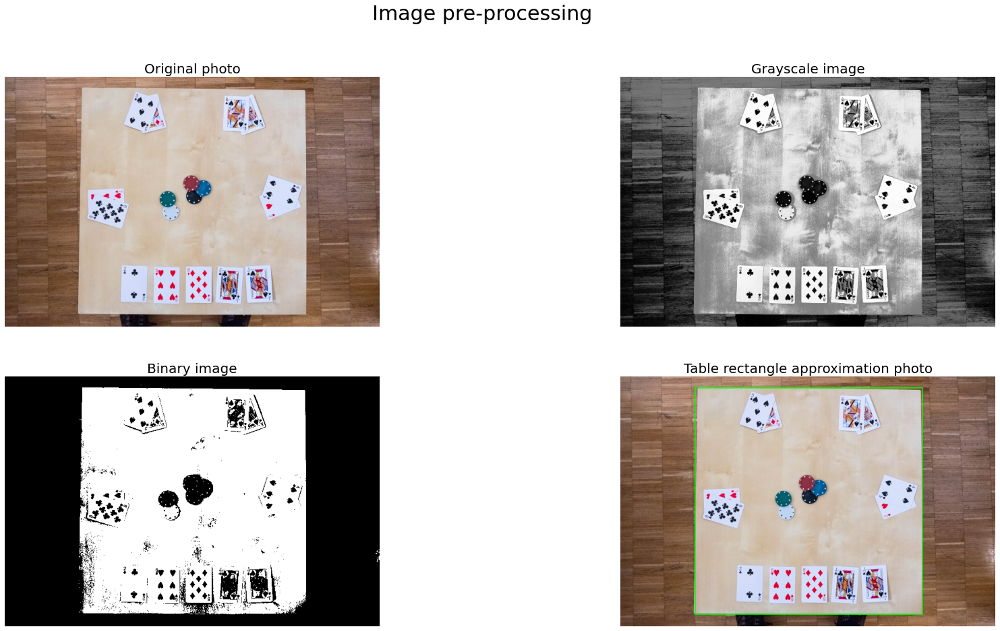

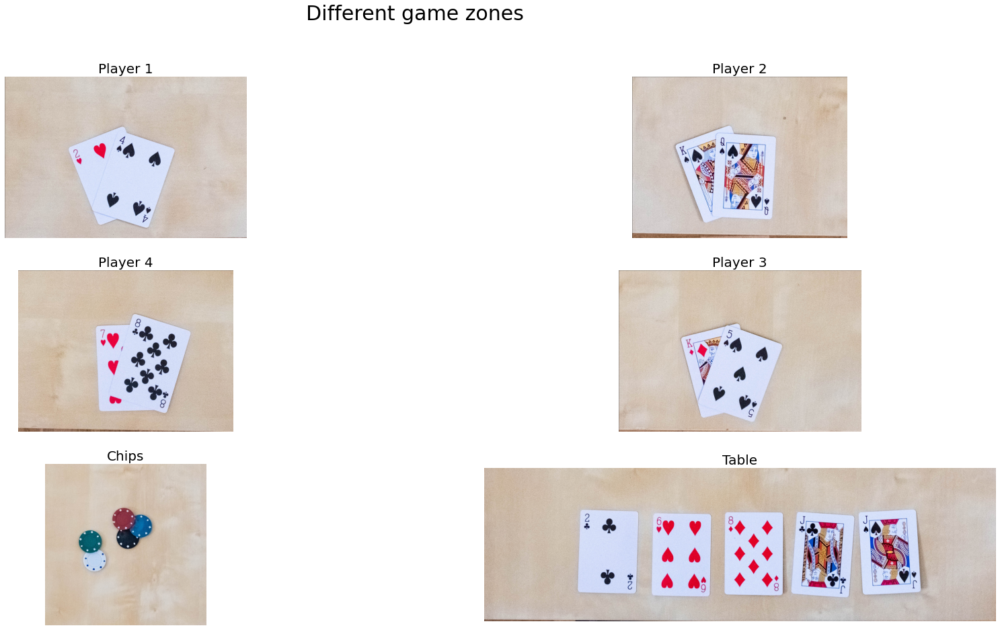

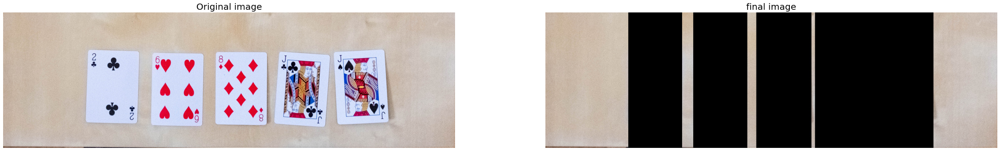

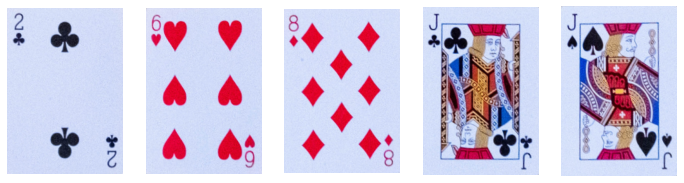

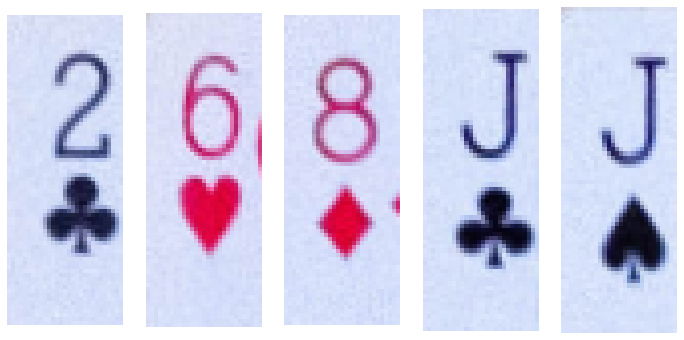

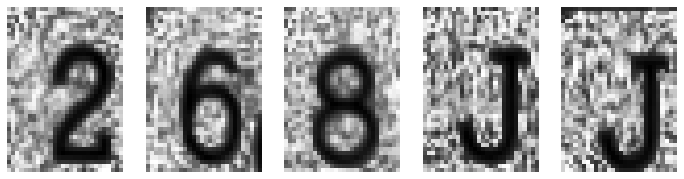

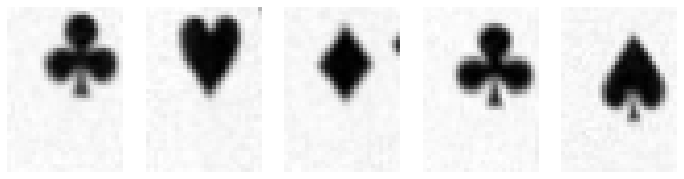

C:\Users\EPFL-LHE\AppData\Local\Temp\ipykernel_17300\3039411524.py:56: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  localMax = peak_local_max(D, indices=False, min_distance=20,labels=closing)


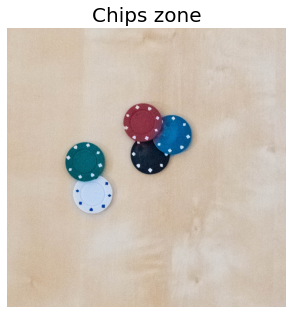

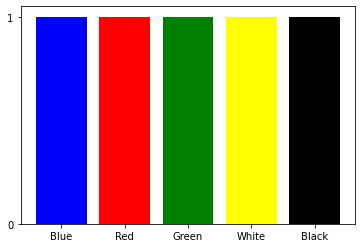

Processing player 1 zone


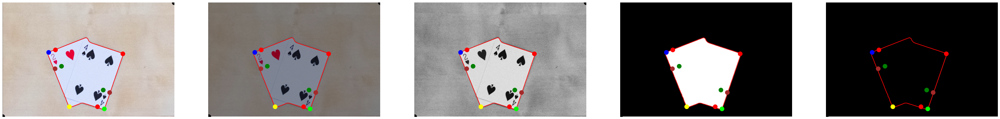

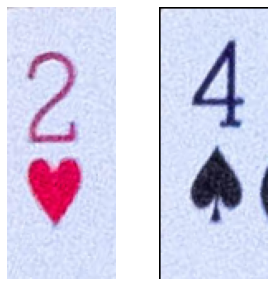

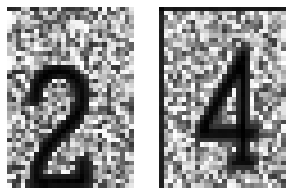

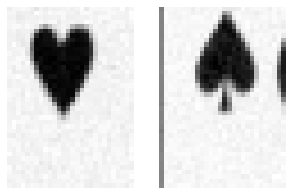

Processing player 2 zone


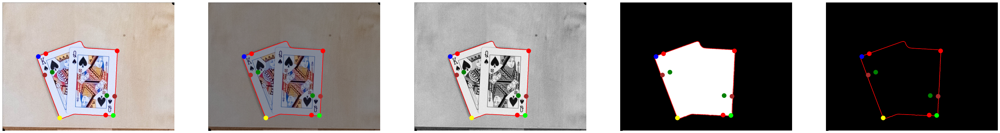

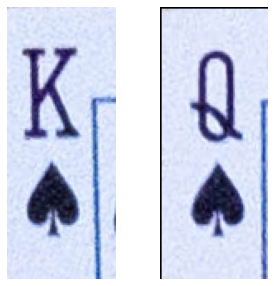

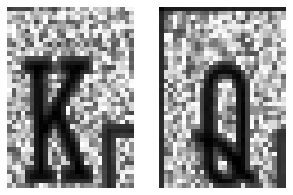

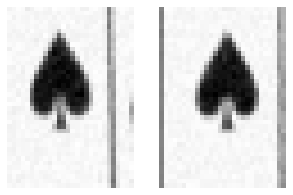

Processing player 3 zone


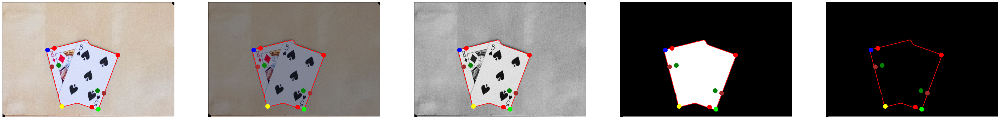

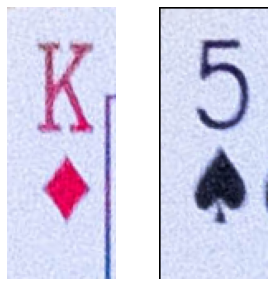

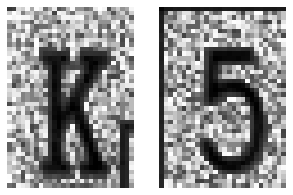

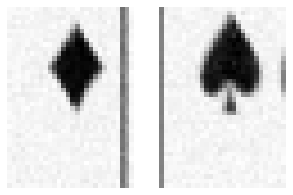

Processing player 4 zone


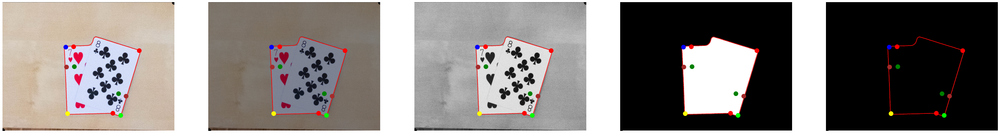

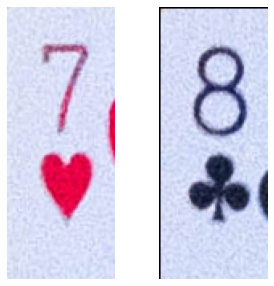

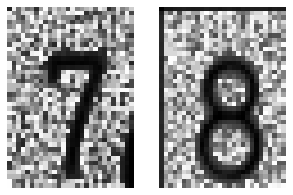

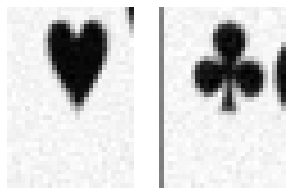

1/1 [==============================] - 0s 11ms/step


C:\Users\EPFL-LHE\AppData\Local\Temp\ipykernel_17300\2410519273.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if img[0] == 'null':


1/1 [==============================] - 0s 12ms/step


In [18]:
train_size = np.loadtxt(os.path.join(path_data, "train_size.txt")).astype(int)
print("Size of trainset:\n\t{}".format(train_size))
game_results = {}

# Evaluate images
games_id = [0]  # to evaluate  three images
#games_id = np.arange(0,28)
#games_id = [0,1,3,5,7,8,9,10,15,16,17,19,22,23,25,26,27]


# We can choose to plot or not mid results. 
plot_preprocessing = True
plot_gamezones = True
plot_tableCards = True
plotChipsCount = True
plotPlayersCards = True

for i in games_id :
    file = os.path.join(path_data, f"train_{str(i).zfill(2)}.jpg")
    # open the image
    im = cv2.imread(file)
    
    # Process the image
    results = process_image(im)
    
    # Append result to array
    game_results[i] = results


In [19]:
# Saving results
file_results = save_results(results=game_results, groupid=group_id)

In [20]:
# Checking the results were loaded correctly
loaded_results = load_results(file_results)
print(loaded_results.keys())

# Read training data
game_labels = pd.read_csv('data/train/train_labels.csv')
game_labels = game_labels.fillna('0')

dict_keys(['0'])


In [21]:
# Evaluate
eval_listof_games( game_results , game_labels , game_id = games_id)

Game 0 results
Estimated game
['2C', '6H', '8D', 'JC', 'JS', '2H', '4S', '10S', 'QS', 'KD', '5S', '7H', '8C', 1, 1, 1, 1, 1]
True game
['2C' '6H' '8D' 'JC' 'JS' '2H' '4S' 'KS' 'QS' 'KD' '5S' '7H' '8C' 1 1 1 1
 1]


             	scores
Card number 	0.92 %
Card suit   	1.0 %
Chips       	1.0 %


FINAL score 	0.97 %
________________________________________
Average SCORE =  0.9743589743589745


0.9743589743589745